In [64]:
# torch
import torch
import torch.distributions as TD
from torch import nn
import torch.nn.functional as F
# from torch.autograd import grad
from functorch import grad, vmap
# import geotorch

# base
import matplotlib as mpl
import matplotlib.pyplot as plt
from cycler import cycler
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import proj3d
from matplotlib.lines import Line2D

from tqdm.auto import tqdm
import logging
import numpy as np
import os
import sys
import itertools
import functools
import operator as ops

from sklearn.decomposition import PCA

import warnings

warnings.filterwarnings("ignore")
sys.path.append("..")

# %matplotlib widget

In [65]:
# dataset utils
from src.utils import Distrib2Sampler
from src.utils import Config

# models
from src.models2D import FullyConnectedMLP

# langevin sampling
from src.eot import sample_langevin_batch
from src.eot_utils import computePotGrad, evaluating
# from src.plotters import plot_training_phase
from src.tools import *
from src import distributions
from src import benchmarks
from src.sph_distributions import HypersphericalUniform, VonMisesFisher

# training utils
from dgm_utils.statsmanager import StatsManager, StatsManagerDrawScheduler

# typing
from typing import Callable, Tuple, Union

DEVICE = 'cuda:0'
# DEVICE = "cpu"

In [66]:
CONFIG = Config()

CONFIG.CLIP_GRADS_NORM = False
CONFIG.HREG = 0.01

CONFIG.LANGEVIN_THRESH = None
CONFIG.LANGEVIN_SAMPLING_NOISE = 0.03
CONFIG.ENERGY_SAMPLING_ITERATIONS = 300
CONFIG.LANGEVIN_DECAY = 1.0
CONFIG.LANGEVIN_SCORE_COEFFICIENT = 1.0
CONFIG.LANGEVIN_COST_COEFFICIENT = 1.0

# learning parameters
CONFIG.MAX_STEPS = 1000
CONFIG.BATCH_SIZE = 256
CONFIG.BASIC_NOISE_VAR = 1.0

CONFIG.NUM = 4
CONFIG.DIM = 3

CONFIG.ALPHAS = 1 / np.ones(CONFIG.NUM)
# CONFIG.ALPHAS = np.array([0.3, 0.7])

CONFIG.OUTPUT_SEED = 0xAB0BA
CONFIG.OUTPUT_FOLDER = None # '../results/hd/rectangles/

assert CONFIG.NUM == len(CONFIG.ALPHAS)

In [67]:
def h(Xs):
    r = Xs.norm(dim=-1)
    zenith = torch.acos(Xs[..., 2] / r)
    azimuth = torch.atan2(Xs[..., 1], Xs[..., 0])
    return torch.stack((azimuth, zenith), dim=-1)

def h_inv(Zs):
    azimuth, zenith = Zs[..., 0], Zs[..., 1]
    return torch.stack((
        torch.sin(zenith) * torch.cos(azimuth),
        torch.sin(zenith) * torch.sin(azimuth),
        torch.cos(zenith),
    ), dim=-1)

In [68]:
assert torch.cuda.is_available()

if DEVICE != "cpu":
    torch.cuda.set_device(DEVICE)

np.random.seed(CONFIG.OUTPUT_SEED)
torch.manual_seed(CONFIG.OUTPUT_SEED)
torch.cuda.manual_seed_all(CONFIG.OUTPUT_SEED)

## Initializing distributions

In [69]:
locs = torch.tensor(
    [
        [-1., -1., 0.], 
        [1., 1., 0.], 
        # [-1., 1., 0.], 
        # [1., -1., 0.], 
        [0., 0., 1.], 
        [0., 0., -1.]
    ]
).to(DEVICE)
locs = locs / torch.norm(locs, dim=-1, keepdim=True)
scales = torch.tensor([50.] * CONFIG.NUM).to(DEVICE)
distribs = []

for loc, scale in zip(locs, scales):
    dist = VonMisesFisher(loc, scale.view(1))
    distribs.append(dist)

In [70]:
dist_samples = [s.sample(10000).cpu() for s in distribs]

In [71]:
def plot_wireframe_3D_sphere(ax, plot_unit_vectors=False):
    '''
    Plot 3D wireframe
    '''
    theta, phi = np.linspace(0, 2 * np.pi, 20), np.linspace(0, np.pi, 20)
    THETA, PHI = np.meshgrid(theta, phi)
    X_vf, Y_vf, Z_vf = np.sin(PHI) * np.cos(THETA), np.sin(PHI) * np.sin(THETA), np.cos(PHI)
    ax.plot_wireframe(X_vf, Y_vf, Z_vf, linewidth=1, alpha=0.25, color="gray")
    ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), np.diag([1., 1., 1.32, 1.]))
    if plot_unit_vectors:
        colors = ['red', 'green', 'blue']
        labels = ['(1, 0, 0)', '(0, 1, 0)', '(0, 0, 1)']
        for loc, color, lbl in zip(torch.eye(3), colors, labels):
            ax.plot(*torch.stack((torch.zeros_like(loc), loc)).T, linewidth=1, color=color, label=lbl)

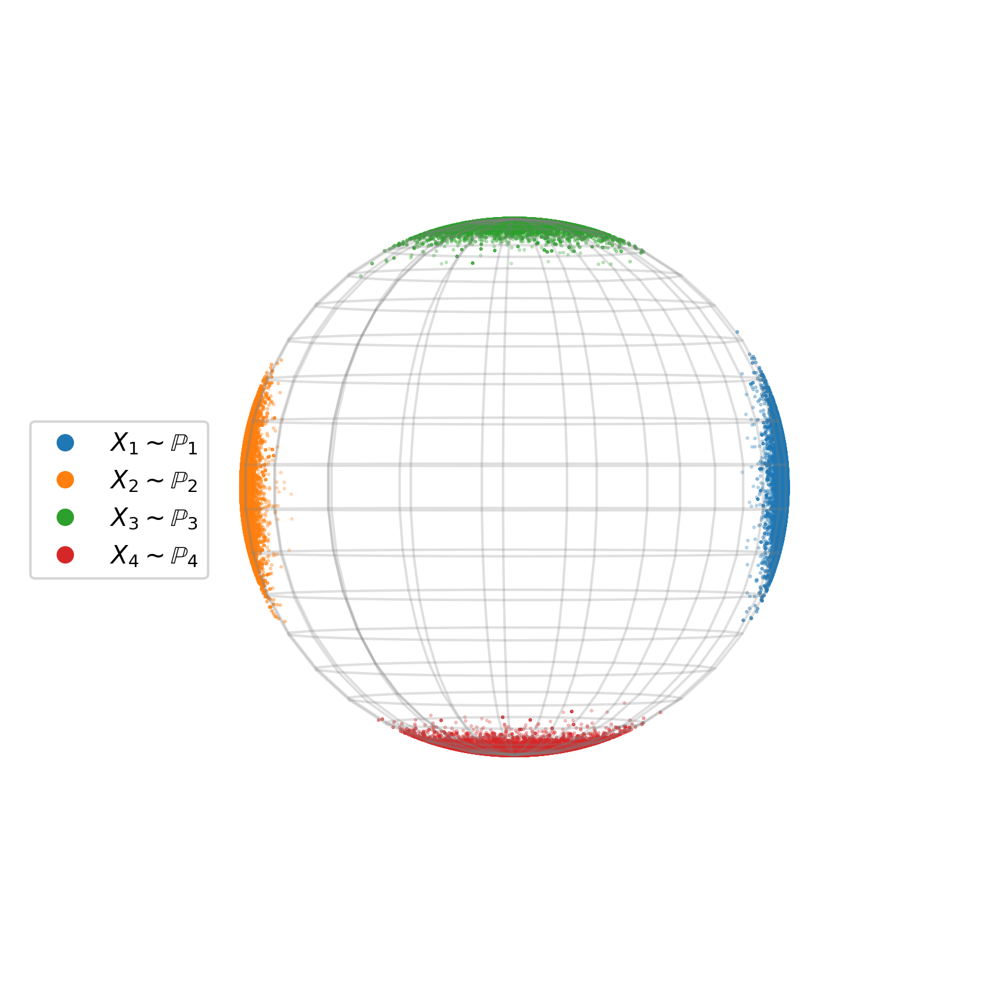

In [72]:
fig = plt.figure(figsize=(7, 7), dpi=300)
ax = fig.add_subplot(111, projection="3d")
ax.view_init(0, 135)

plot_wireframe_3D_sphere(ax)

legend_entries = []
for i, ds in enumerate(dist_samples):
    ax.scatter(*ds.T, s=0.2)
    legend_entries.append(Line2D(
        [0], [0],
        marker="o",
        ls="none",
        c=f"C{i}",
        label=f"$X_{i+1} \sim \mathbb{{P}}_{i+1}$"
    ))

ax.set_axis_off()
ax.legend(handles=legend_entries, loc="center left")

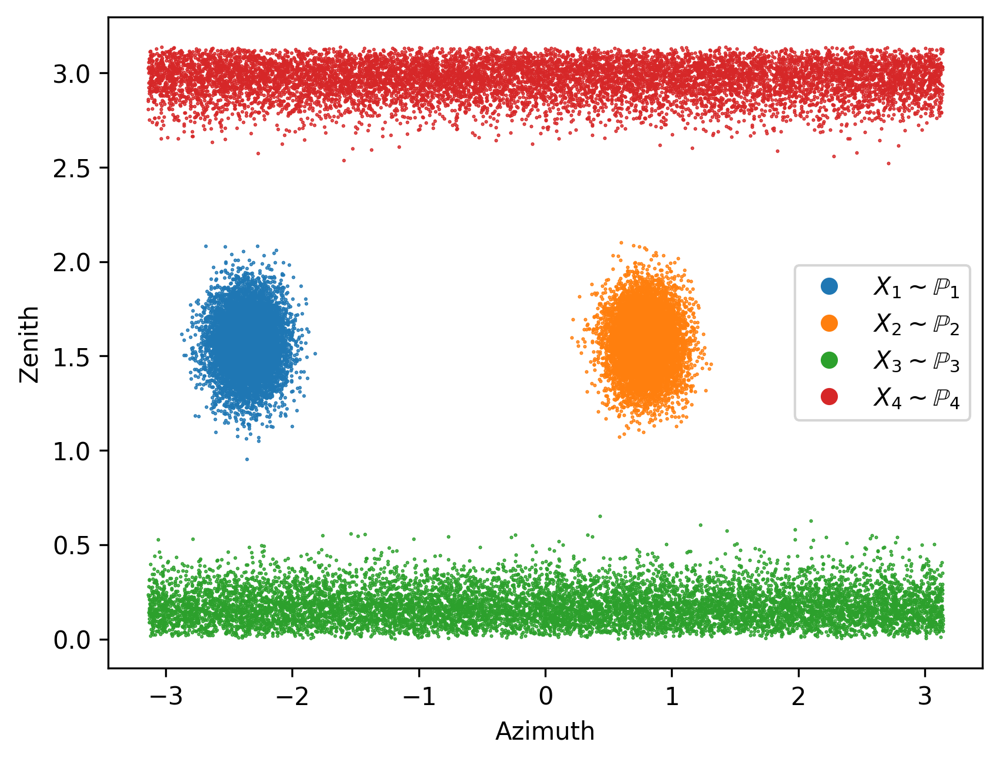

In [73]:
fig = plt.figure(dpi=300)
ax = fig.add_subplot(111)

legend_entries=[]
for i, ds in enumerate(dist_samples):
    ax.scatter(*h(ds).T, s=0.2)
    legend_entries.append(Line2D(
        [0], [0],
        marker="o",
        ls="none",
        c=f"C{i}",
        label=f"$X_{i+1} \sim \mathbb{{P}}_{i+1}$"
    ))

ax.set_xlabel("Azimuth")
ax.set_ylabel("Zenith")
ax.legend(handles=legend_entries)

# Nets

In [74]:
nets = nn.ModuleList([FullyConnectedMLP(CONFIG.DIM, [32, 32], 1).to(DEVICE) for _ in range(CONFIG.NUM)])
opt = torch.optim.Adam(nets.parameters(), lr=3e-3)

def make_f_pot(idx):
    def f_pot(x):
        res = 0.0
        for i, (net, alpha) in enumerate(zip(nets, CONFIG.ALPHAS)):
            if i == idx:
                res += net(x)
            else:
                res -= alpha * net(x) / (CONFIG.NUM - 1) / CONFIG.ALPHAS[idx]
        return res
    return f_pot

f_pots = [make_f_pot(i) for i in range(CONFIG.NUM)]

In [75]:
def cost_grad_y(y: torch.Tensor, x: torch.Tensor):
    def f(y_in, x_in):
        xy = x_in @ y_in
        xx = x_in @ x_in
        pseudo_x = xy * x_in.norm()
        pseudo_y = (y_in * xx - x_in * xy).norm()
        angle = torch.atan2(pseudo_y, pseudo_x)
        return 0.5 * angle**2
    
    g = vmap(grad(f))
    return g(y, x)


def l2_grad_y(y, x):
    '''
    returns \nabla_y c(x, y)
    '''
    return y - x


grad_fn = cost_grad_y


def cond_score(
        f : Callable[[torch.Tensor], torch.Tensor], 
        cost_grad_y_fn : Callable[[torch.Tensor, torch.Tensor], torch.Tensor], 
        y : torch.Tensor,
        x : torch.Tensor,
        config: Config,
        ret_stats=False
    ) -> Union[Tuple[torch.Tensor, torch.Tensor, torch.Tensor], torch.Tensor]:
    with torch.enable_grad():
        y.requires_grad_(True)
        proto_s = f(y)
        s = computePotGrad(y, proto_s)
        assert s.shape == y.shape
    cost_coeff = config.LANGEVIN_COST_COEFFICIENT * (config.LANGEVIN_SAMPLING_NOISE ** 2 / config.HREG)
    cost_part = cost_grad_y_fn(y, x) * cost_coeff
    score_part = s * config.LANGEVIN_SCORE_COEFFICIENT
    if not ret_stats:
        return score_part - cost_part
    return score_part - cost_part, cost_part, score_part

def project_sphere(x: torch.Tensor) -> torch.Tensor:
    return x / x.norm(dim=-1, keepdim=True)

def sample_langevin_mu_f(
        f: Callable[[torch.Tensor], torch.Tensor], 
        x: torch.Tensor, 
        y_init: torch.Tensor, 
        config: Config
    ) -> torch.Tensor:
    
    def score(y, ret_stats=False):
        return cond_score(f, grad_fn, y, x, config, ret_stats=ret_stats)
    
    y, r_t, cost_r_t, score_r_t, noise_norm = sample_langevin_batch(
        score, 
        y_init,
        n_steps=config.ENERGY_SAMPLING_ITERATIONS, 
        decay=config.LANGEVIN_DECAY, 
        thresh=config.LANGEVIN_THRESH, 
        noise=config.LANGEVIN_SAMPLING_NOISE, 
        data_projector=project_sphere, 
        compute_stats=True)
    
    return y

In [76]:
class SphUniformSampler:
    def __init__(self, dim):
        self._distr = TD.Normal(
            torch.zeros(dim).to(DEVICE), 
            torch.ones(dim).to(DEVICE),
        )
    def sample(self, size):
        if not isinstance(size, tuple):
            size = (size,)
        rvs = self._distr.sample(size)
        return project_sphere(rvs)

In [77]:
init_noise_sampler = SphUniformSampler(3)
# init_noise_sampler = Distrib2Sampler(TD.Normal(
#     torch.zeros(CONFIG.DIM).to(DEVICE), 
#     torch.ones(CONFIG.DIM).to(DEVICE)))

In [78]:
samplers = distribs

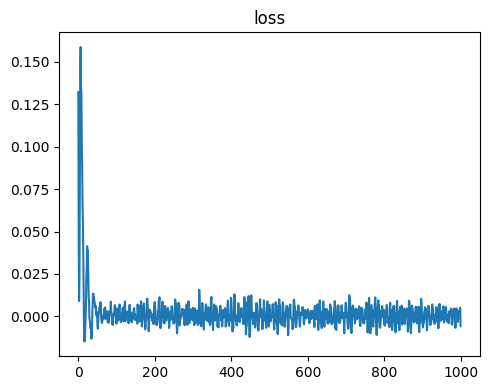

100%|██████████| 1000/1000 [2:45:11<00:00,  9.91s/it]


In [39]:
SMDS = StatsManagerDrawScheduler(StatsManager('loss'), 1, 1, (5, 4), epoch_freq=10)

for it in tqdm(range(CONFIG.MAX_STEPS)):
    Xs = [s.sample(CONFIG.BATCH_SIZE).to(DEVICE) for s in samplers]
    Ys_init = [init_noise_sampler.sample(CONFIG.BATCH_SIZE).to(DEVICE) for _ in range(CONFIG.NUM)]

    nets.eval()
    with torch.no_grad():
        Ys = [sample_langevin_mu_f(f, X.to(DEVICE), Y_init, CONFIG) for f, X, Y_init in zip(f_pots, Xs, Ys_init)]

    nets.train()
    loss = sum(alpha * f(Y).mean() for alpha, f, Y in zip(CONFIG.ALPHAS, f_pots, Ys))
    opt.zero_grad()
    loss.backward()
    opt.step()
    SMDS.SM.upd('loss', loss.item())
    SMDS.epoch()

In [79]:
ckpt = {
    "state": nets.state_dict(),
    "config": CONFIG.__dict__
}
torch.save(ckpt, "sphere_4.ckpt")

In [80]:
ckpt = torch.load("sphere_4.ckpt")
nets.load_state_dict(ckpt["state"])

<All keys matched successfully>

In [81]:
N_SAMPLES = 10_000

In [82]:
nets.eval()
Xs = [s.sample(N_SAMPLES).to(DEVICE) for s in samplers]
Ys_init = [init_noise_sampler.sample(N_SAMPLES).to(DEVICE) for _ in range(CONFIG.NUM)]
with torch.no_grad():
    Ys = [sample_langevin_mu_f(f, X.to(DEVICE), Y_init, CONFIG) for f, X, Y_init in zip(f_pots, Xs, Ys_init)]

In [83]:
dist_samples = [s.sample(N_SAMPLES).cpu() for s in samplers]
bary_sample = torch.cat(Ys, dim=0).cpu()

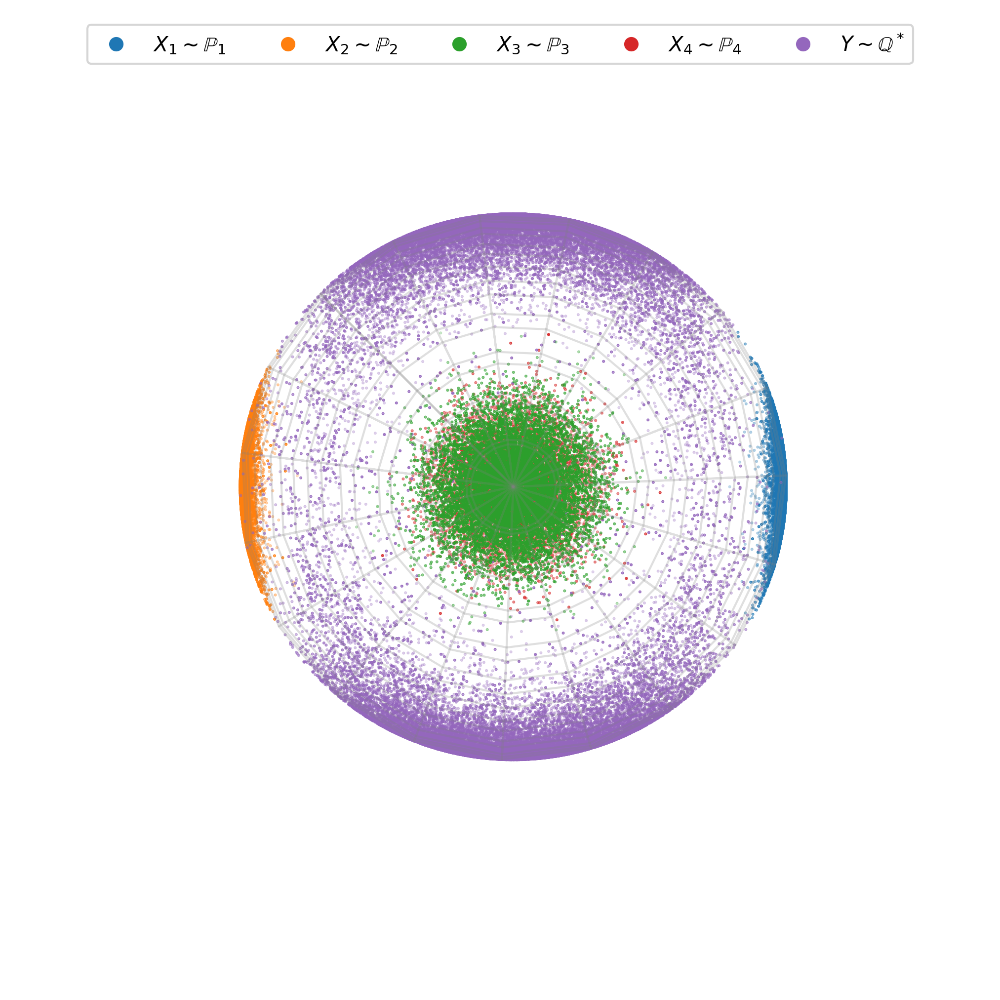

In [116]:
fig = plt.figure(figsize=(7, 7), dpi=300)

ax = fig.add_subplot(111, projection="3d")
ax.view_init(90, 135)

plot_wireframe_3D_sphere(ax)

legend_entries = []
for i, ds in enumerate(dist_samples):
    ax.scatter(*ds.T, s=0.2)
    legend_entries.append(Line2D(
        [0], [0],
        marker="o",
        ls="none",
        c=f"C{i}",
        label=f"$X_{i+1} \sim \mathbb{{P}}_{i+1}$"
    ))
    
ax.scatter(*bary_sample.T, s=0.2)
legend_entries.append(Line2D(
    [0], [0],
    marker="o",
    ls="none",
    c=f"C{i+1}",
    label=f"$Y \sim \mathbb{{Q}}^*$",
))
ax.set_axis_off()
ax.legend(handles=legend_entries, loc="upper center", ncols=5)
fig.tight_layout()

In [115]:
fig.savefig("sphere_90_135_row.svg")

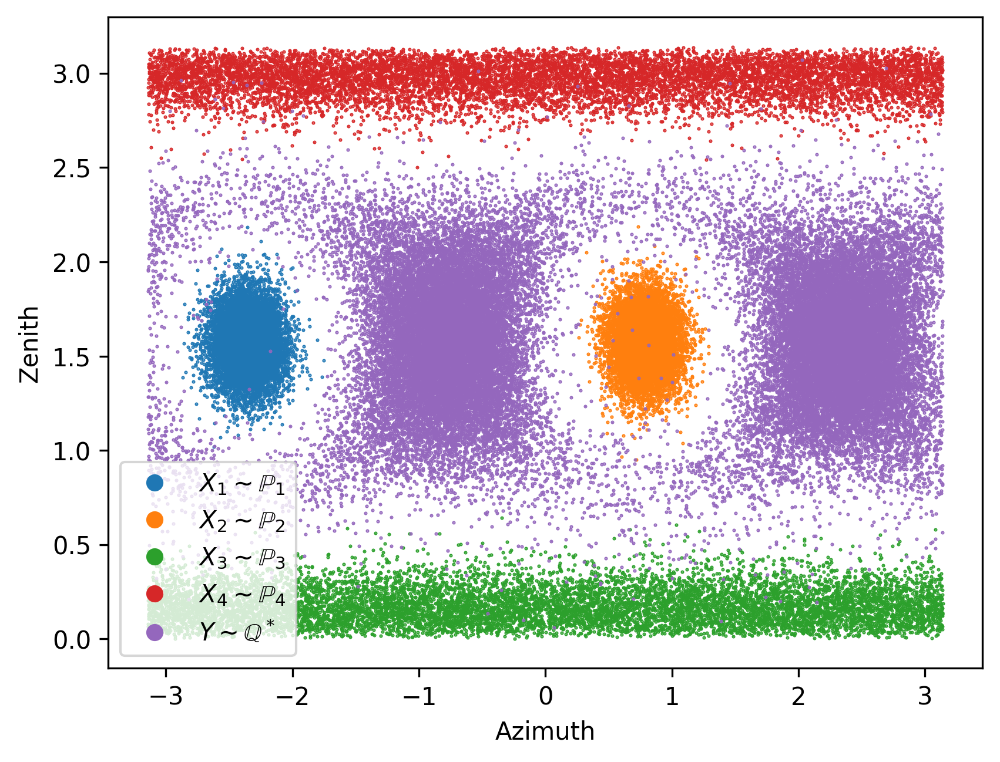

In [88]:
fig = plt.figure(dpi=300)
ax = fig.add_subplot(111)

legend_entries=[]
for i, ds in enumerate(dist_samples):
    ax.scatter(*h(ds).T, s=0.2)
    legend_entries.append(Line2D(
        [0], [0],
        marker="o",
        ls="none",
        c=f"C{i}",
        label=f"$X_{i+1} \sim \mathbb{{P}}_{i+1}$"
    ))
    
ax.scatter(*h(bary_sample).T, s=0.2)
legend_entries.append(Line2D(
    [0], [0],
    marker="o",
    ls="none",
    c=f"C{i+1}",
    label=f"$Y \sim \mathbb{{Q}}^*$",
))

ax.set_xlabel("Azimuth")
ax.set_ylabel("Zenith")
ax.legend(handles=legend_entries)

fig.savefig("projection_stock.svg")

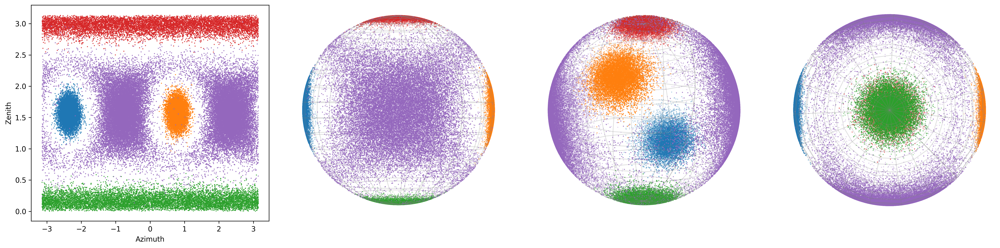

In [147]:
fig = plt.figure(figsize=(20, 5), dpi=300)

ax = fig.add_subplot(141)

legend_entries=[]
for i, ds in enumerate(dist_samples):
    ax.scatter(*h(ds).T, s=0.2)
    legend_entries.append(Line2D(
        [0], [0],
        marker="o",
        ls="none",
        c=f"C{i}",
        label=f"$X_{i+1} \sim \mathbb{{P}}_{i+1}$"
    ))
    
ax.scatter(*h(bary_sample).T, s=0.2)
legend_entries.append(Line2D(
    [0], [0],
    marker="o",
    ls="none",
    c=f"C{i+1}",
    label=f"$Y \sim \mathbb{{Q}}^*$",
))

ax.set_xlabel("Azimuth")
ax.set_ylabel("Zenith")

for i, view in enumerate(((0, 135), (20, 30), (90, 135))):
    
    ax = fig.add_subplot(142 + i, projection="3d")
    ax.view_init(*view, 180)
    plot_wireframe_3D_sphere(ax)
    
    for i, ds in enumerate(dist_samples):
        ax.scatter(*ds.T, s=0.2)
        
    ax.scatter(*bary_sample.T, s=0.2)
    ax.set_axis_off()
    ax.set_xlim(-0.73, 0.73)
    ax.set_ylim(-0.73, 0.73)
    ax.set_zlim(-0.73, 0.73)

# fig.legend(handles=legend_entries, loc="upper center", ncols=5, fontsize=14)
fig.tight_layout()

In [148]:
fig.savefig("all.png")